In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

<a id="1."></a> 
# 1.Sharpening
By altering our kernels we can implement sharpening, which has the effects of in strengthening or emphasizing edges in an image.

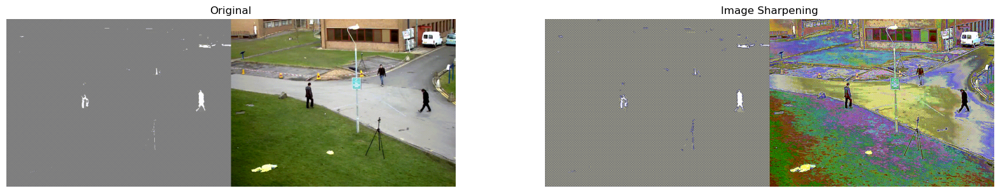

In [10]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import zipfile
import os
import imageio

# Step 1: Extract the .gif file from the .zip archive
zip_path = r"C:\Users\sanja\Downloads\Background-Subtraction-Tutorial_merged.gif.zip"
extract_to = r"C:\Users\sanja\Downloads\extracted_gif"

# Extract the .zip file
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

# Locate the extracted .gif file (update filename if necessary)
gif_path = os.path.join(extract_to, "Background-Subtraction-Tutorial_merged.gif")

# Step 2: Load the first frame of the .gif using imageio.get_reader
reader = imageio.get_reader(gif_path)
frame = reader.get_data(0)  # Get the first frame

# Convert the frame to BGR format for OpenCV processing
image = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)

# Step 3: Image sharpening
# Define the sharpening kernel
kernel_sharpening = np.array([[-1, -1, -1],
                              [-1, 9, -1],
                              [-1, -1, -1]])

# Apply the sharpening kernel to the input image
sharpened = cv2.filter2D(image, -1, kernel_sharpening)

# Step 4: Display the original and sharpened images
plt.figure(figsize=(20, 20))

# Original Image
plt.subplot(1, 2, 1)
plt.title("Original")
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))  # Convert back to RGB for display
plt.axis("off")

# Sharpened Image
plt.subplot(1, 2, 2)
plt.title("Image Sharpening")
plt.imshow(cv2.cvtColor(sharpened, cv2.COLOR_BGR2RGB))  # Convert back to RGB for display
plt.axis("off")

plt.show()



<a id="2."></a> 
# 2.Thresholding, Binarization & Adaptive Thresholding

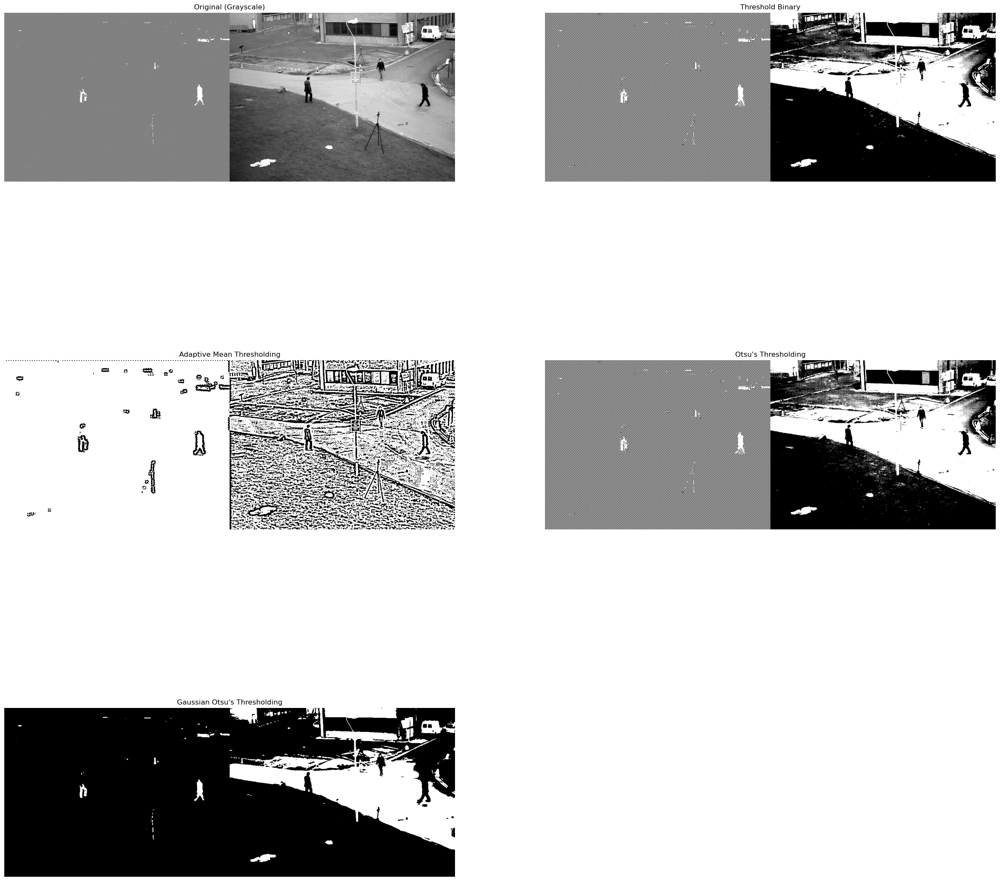

In [14]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import zipfile
import os
import imageio

# Step 1: Extract and load the .gif file
zip_path = r"C:\Users\sanja\Downloads\Background-Subtraction-Tutorial_merged.gif.zip"
extract_to = r"C:\Users\sanja\Downloads\extracted_gif"

# Extract the .zip file
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

# Locate the .gif file (update filename if necessary)
gif_path = os.path.join(extract_to, "Background-Subtraction-Tutorial_merged.gif")

# Read the first frame of the .gif using imageio
reader = imageio.get_reader(gif_path)
frame = reader.get_data(0)  # Get the first frame

# Convert the frame to grayscale (necessary for thresholding)
gray_image = cv2.cvtColor(frame, cv2.COLOR_RGB2GRAY)

# Step 2: Apply thresholding and display the results
plt.figure(figsize=(30, 30))

# Original Image
plt.subplot(3, 2, 1)
plt.title("Original (Grayscale)")
plt.imshow(gray_image, cmap='gray')
plt.axis("off")

# Binary Threshold
ret, thresh1 = cv2.threshold(gray_image, 127, 255, cv2.THRESH_BINARY)
plt.subplot(3, 2, 2)
plt.title("Threshold Binary")
plt.imshow(thresh1, cmap='gray')
plt.axis("off")

# Gaussian Blur to reduce noise
blurred_image = cv2.GaussianBlur(gray_image, (3, 3), 0)

# Adaptive Thresholding
adaptive_thresh = cv2.adaptiveThreshold(
    blurred_image, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2
)
plt.subplot(3, 2, 3)
plt.title("Adaptive Mean Thresholding")
plt.imshow(adaptive_thresh, cmap='gray')
plt.axis("off")

# Otsu's Thresholding
_, otsu_thresh = cv2.threshold(gray_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
plt.subplot(3, 2, 4)
plt.title("Otsu's Thresholding")
plt.imshow(otsu_thresh, cmap='gray')
plt.axis("off")

# Otsu's Thresholding After Gaussian Blur
blurred_otsu = cv2.GaussianBlur(gray_image, (5, 5), 0)
_, otsu_blur_thresh = cv2.threshold(blurred_otsu, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
plt.subplot(3, 2, 5)
plt.title("Gaussian Otsu's Thresholding")
plt.imshow(otsu_blur_thresh, cmap='gray')
plt.axis("off")

plt.show()


<a id="3."></a> 
# 3.Dilation, Erosion, Opening and Closing

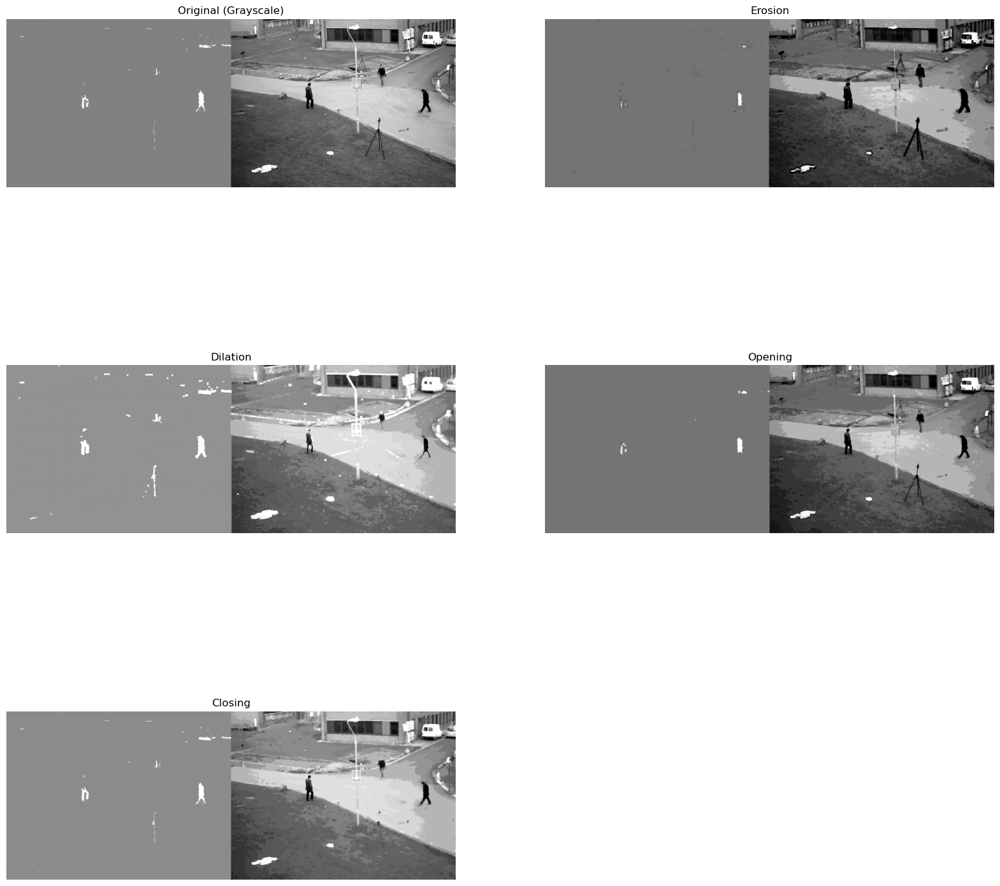

In [20]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import zipfile
import os
import imageio

# Step 1: Extract and load the .gif file
zip_path = r"C:\Users\sanja\Downloads\Background-Subtraction-Tutorial_merged.gif.zip"
extract_to = r"C:\Users\sanja\Downloads\extracted_gif"

# Extract the .zip file
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

# Locate the .gif file
gif_path = os.path.join(extract_to, "Background-Subtraction-Tutorial_merged.gif")

# Read the first frame of the .gif
reader = imageio.get_reader(gif_path)
frame = reader.get_data(0)  # Get the first frame

# Convert the frame to grayscale for morphological operations
gray_image = cv2.cvtColor(frame, cv2.COLOR_RGB2GRAY)

# Step 2: Define kernel
kernel = np.ones((5, 5), np.uint8)

# Step 3: Apply morphological operations
erosion = cv2.erode(gray_image, kernel, iterations=1)
dilation = cv2.dilate(gray_image, kernel, iterations=1)
opening = cv2.morphologyEx(gray_image, cv2.MORPH_OPEN, kernel)
closing = cv2.morphologyEx(gray_image, cv2.MORPH_CLOSE, kernel)

# Step 4: Visualize the results
plt.figure(figsize=(20, 20))

# Original Image
plt.subplot(3, 2, 1)
plt.title("Original (Grayscale)")
plt.imshow(gray_image, cmap='gray')
plt.axis("off")

# Erosion
plt.subplot(3, 2, 2)
plt.title("Erosion")
plt.imshow(erosion, cmap='gray')
plt.axis("off")

# Dilation
plt.subplot(3, 2, 3)
plt.title("Dilation")
plt.imshow(dilation, cmap='gray')
plt.axis("off")

# Opening
plt.subplot(3, 2, 4)
plt.title("Opening")
plt.imshow(opening, cmap='gray')
plt.axis("off")

# Closing
plt.subplot(3, 2, 5)
plt.title("Closing")
plt.imshow(closing, cmap='gray')
plt.axis("off")

plt.show()


<a id="4."></a> 
# 4.Edge Detection & Image Gradients


NameError: name 'sobel_x' is not defined

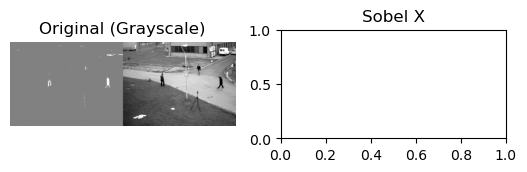

In [28]:
plt.subplot(3, 2, 1)
plt.title("Original (Grayscale)")
plt.imshow(gray_image, cmap='gray')
plt.axis("off")  # Fixed here

# Sobel X
plt.subplot(3, 2, 2)
plt.title("Sobel X")
plt.imshow(sobel_x, cmap='gray')
plt.axis("off")  # Fixed here

# Sobel Y
plt.subplot(3, 2, 3)
plt.title("Sobel Y")
plt.imshow(sobel_y, cmap='gray')
plt.axis("off")  # Fixed here

# Sobel OR
plt.subplot(3, 2, 4)
plt.title("Sobel OR")
plt.imshow(sobel_or, cmap='gray')
plt.axis("off")  # Fixed here

# Laplacian
plt.subplot(3, 2, 5)
plt.title("Laplacian")
plt.imshow(laplacian, cmap='gray')
plt.axis("off")  # Fixed here

# Canny
plt.subplot(3, 2, 6)
plt.title("Canny Edge Detection")
plt.imshow(canny, cmap='gray')
plt.axis("off")  # Fixed here


<a id="5."></a> 
# 5.Perpsective Transform

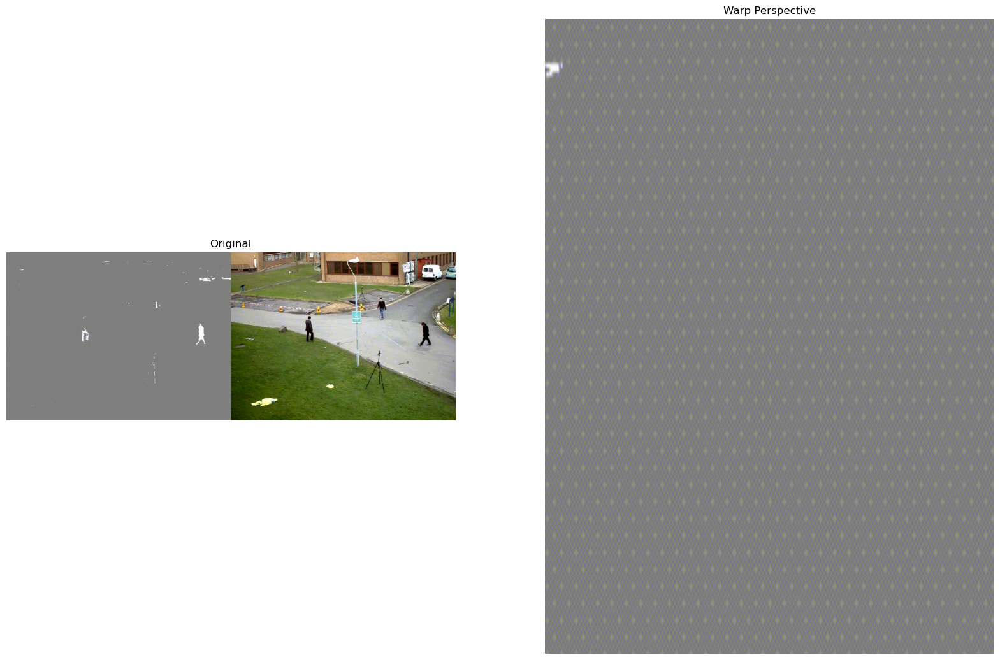

In [34]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import zipfile
import os
import imageio

# Step 1: Extract the .gif file
zip_path = r"C:\Users\sanja\Downloads\Background-Subtraction-Tutorial_merged.gif.zip"
extract_to = r"C:\Users\sanja\Downloads\extracted_gif"

# Unzip the file
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

# Locate the .gif file
gif_path = os.path.join(extract_to, "Background-Subtraction-Tutorial_merged.gif")

# Step 2: Load the first frame of the .gif
reader = imageio.get_reader(gif_path)
frame = reader.get_data(0)  # Get the first frame

# Convert the frame to RGB
image = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)

# Step 3: Perspective Transformation
# Define the coordinates of the 4 corners of the original image
points_A = np.float32([[50, 50], [300, 50], [50, 200], [300, 200]])

# Define the coordinates for the output (A4 aspect ratio)
points_B = np.float32([[0, 0], [420, 0], [0, 594], [420, 594]])

# Compute the Perspective Transformation matrix
M = cv2.getPerspectiveTransform(points_A, points_B)

# Warp the perspective
warped = cv2.warpPerspective(image, M, (420, 594))

# Step 4: Display the original and warped images
plt.figure(figsize=(20, 20))

# Original Image
plt.subplot(1, 2, 1)
plt.title("Original")
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis("off")

# Warped Image
plt.subplot(1, 2, 2)
plt.title("Warp Perspective")
plt.imshow(cv2.cvtColor(warped, cv2.COLOR_BGR2RGB))
plt.axis("off")

plt.show()




<a id="6."></a> 
# 6.Scaling, re-sizing and interpolations

Re-sizing is very easy using the cv2.resize function, it's arguments are: cv2.resize(image, dsize(output image size), x scale, y scale, interpolation)

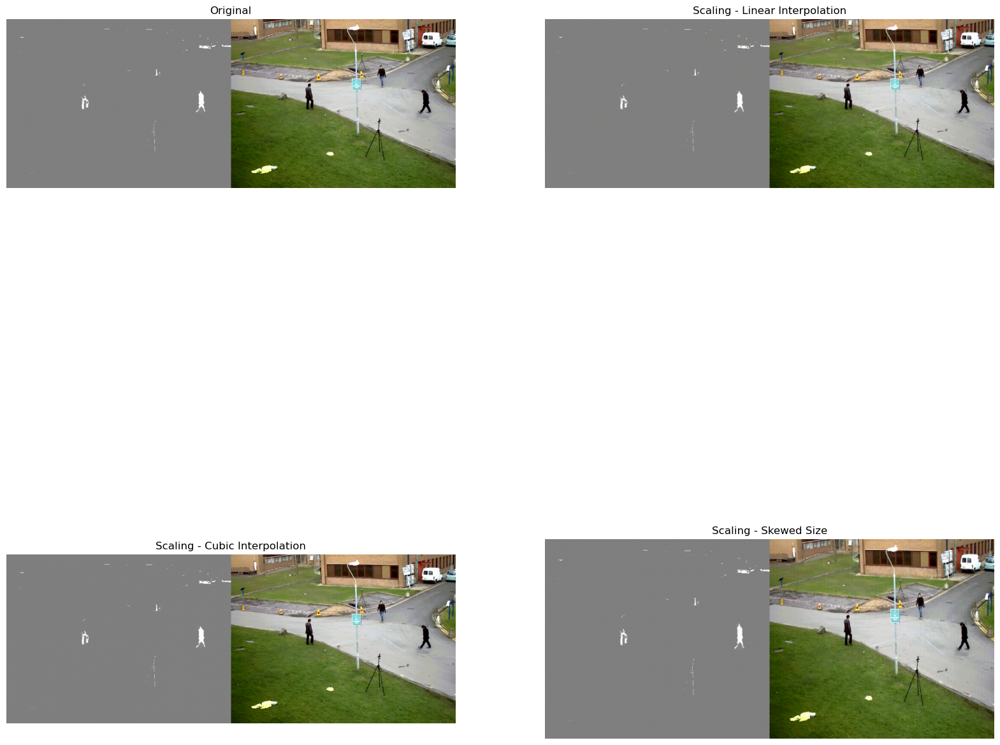

In [42]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import zipfile
import os
import imageio

# Step 1: Extract the .gif file from the zip
zip_path = r"C:\Users\sanja\Downloads\Background-Subtraction-Tutorial_merged.gif.zip"
extract_to = r"C:\Users\sanja\Downloads\extracted_gif"

# Unzipping the .gif
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

# Locate the extracted .gif file
gif_path = os.path.join(extract_to, "Background-Subtraction-Tutorial_merged.gif")

# Step 2: Load the .gif file using imageio.get_reader()
reader = imageio.get_reader(gif_path)

# Read the first frame (you can loop through frames if needed)
image = reader.get_data(0)  # Reads the first frame

# Convert the frame to RGB (imageio loads as RGBA)
image = cv2.cvtColor(image, cv2.COLOR_RGBA2RGB)

# Step 3: Apply the scaling operations
plt.figure(figsize=(20, 20))

# Original Image
plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(image)
plt.axis("off")

# Scaling - Linear Interpolation (3/4 of the original size)
image_scaled = cv2.resize(image, None, fx=0.75, fy=0.75)

plt.subplot(2, 2, 2)
plt.title("Scaling - Linear Interpolation")
plt.imshow(image_scaled)
plt.axis("off")

# Scaling - Cubic Interpolation (double the original size)
img_scaled = cv2.resize(image, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)

plt.subplot(2, 2, 3)
plt.title("Scaling - Cubic Interpolation")
plt.imshow(img_scaled)
plt.axis("off")

# Scaling - Skewed Size (exact dimensions)
img_scaled = cv2.resize(image, (900, 400), interpolation=cv2.INTER_AREA)

plt.subplot(2, 2, 4)
plt.title("Scaling - Skewed Size")
plt.imshow(img_scaled)
plt.axis("off")

plt.show()


<a id="7."></a> 
# 7.Image Pyramids
Useful when scaling images in object detection.

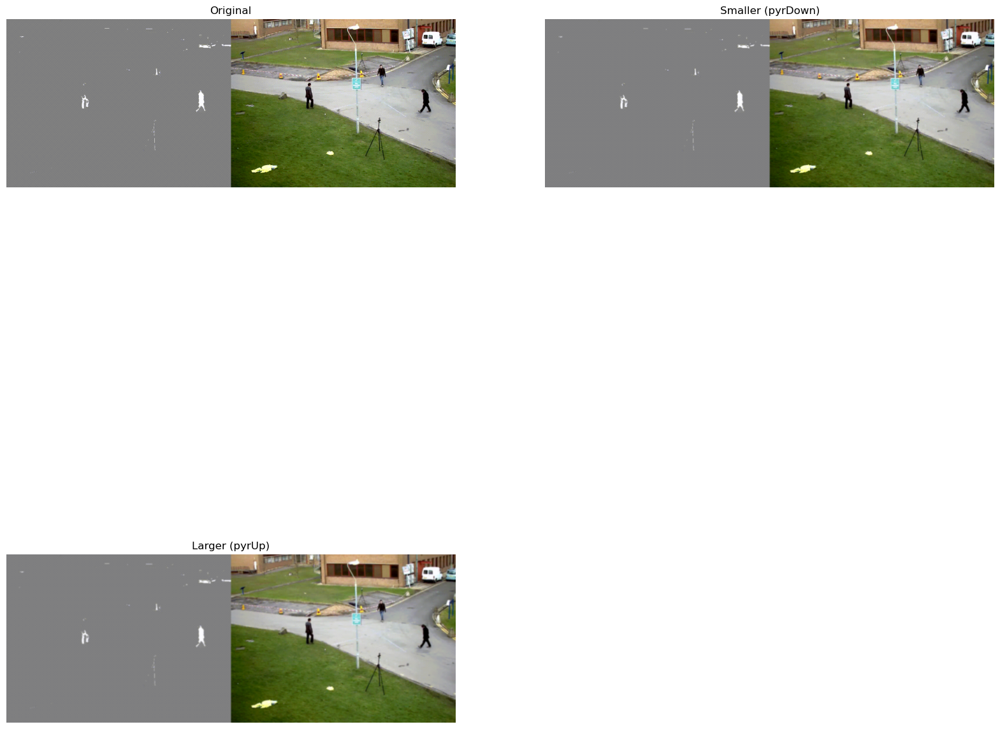

In [54]:
# Step 4: Visualize the original and transformed images
plt.figure(figsize=(20, 20))

plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(image)
plt.axis("off")  # Hide axes

plt.subplot(2, 2, 2)
plt.title("Smaller (pyrDown)")
plt.imshow(smaller)
plt.axis("off")

plt.subplot(2, 2, 3)
plt.title("Larger (pyrUp)")
plt.imshow(larger)
plt.axis("off")

plt.show()



<a id="8."></a> 
# 8.Cropping

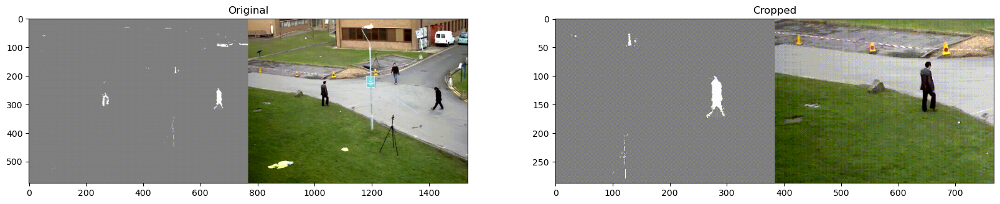

In [60]:
import zipfile
import os
import imageio
import cv2
import matplotlib.pyplot as plt

# Step 1: Extract the .gif file from the ZIP archive
zip_path = r"C:\Users\sanja\Downloads\Background-Subtraction-Tutorial_merged.gif.zip"
extract_to = r"C:\Users\sanja\Downloads\extracted_gif"

# Unzipping the .gif
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

# Locate the extracted .gif file
gif_path = os.path.join(extract_to, "Background-Subtraction-Tutorial_merged.gif")

# Step 2: Load the .gif file using imageio
reader = imageio.get_reader(gif_path)

# Read the first frame of the GIF
image = reader.get_data(0)  # First frame from the GIF

# Convert RGBA (imageio loads as RGBA) to RGB for proper visualization with OpenCV
image = cv2.cvtColor(image, cv2.COLOR_RGBA2RGB)

# Step 3: Visualize the original image and crop
plt.figure(figsize=(20, 20))

plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(image)

# Get image dimensions
height, width = image.shape[:2]

# Crop the image (top-left to bottom-right)
start_row, start_col = int(height * .25), int(width * .25)
end_row, end_col = int(height * .75), int(width * .75)

# Crop the region of interest (ROI)
cropped = image[start_row:end_row, start_col:end_col]

# Display cropped image
plt.subplot(2, 2, 2)
plt.title("Cropped")
plt.imshow(cropped)

plt.show()



<a id="9."></a> 
# 9.Blurring


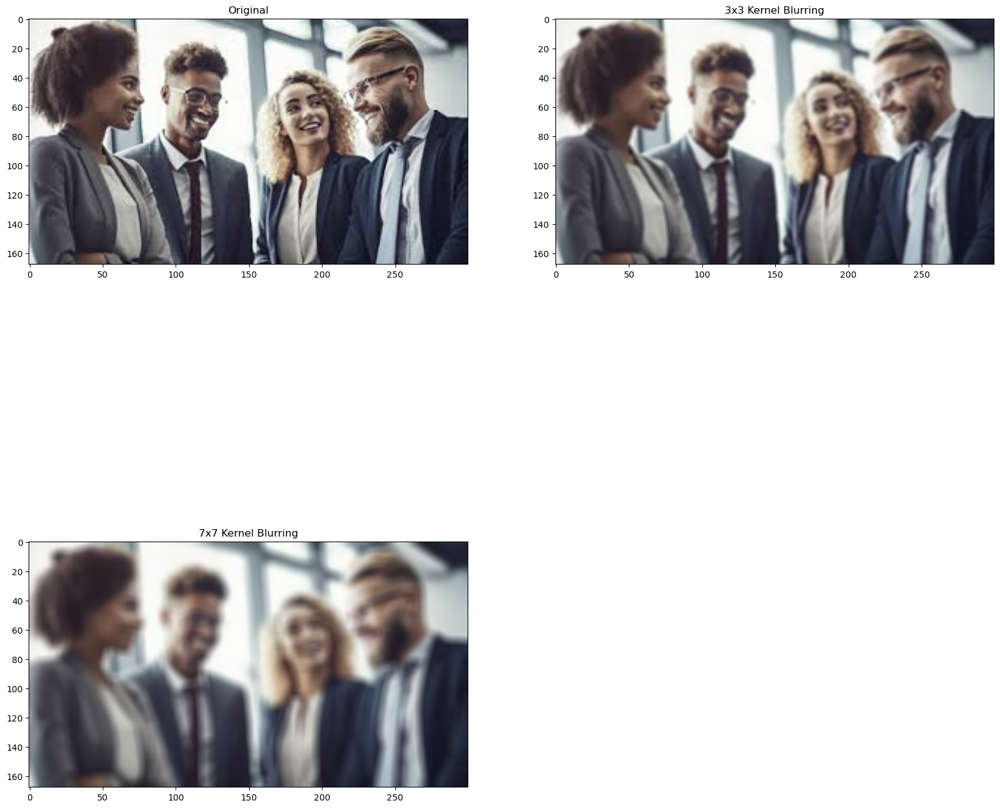

In [107]:
image = cv2.imread(r"C:\Users\sanja\Downloads\images.jpeg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20, 20))

plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(image)

# Creating our 3 x 3 kernel
kernel_3x3 = np.ones((3, 3), np.float32) / 9

# We use the cv2.fitler2D to conovlve the kernal with an image 
blurred = cv2.filter2D(image, -1, kernel_3x3)

plt.subplot(2, 2, 2)
plt.title("3x3 Kernel Blurring")
plt.imshow(blurred)

# Creating our 7 x 7 kernel
kernel_7x7 = np.ones((7, 7), np.float32) / 49

blurred2 = cv2.filter2D(image, -1, kernel_7x7)

plt.subplot(2, 2, 3)
plt.title("7x7 Kernel Blurring")
plt.imshow(blurred2)


<a id="10."></a> 
# 10.Contours


Number of Contours found = 185


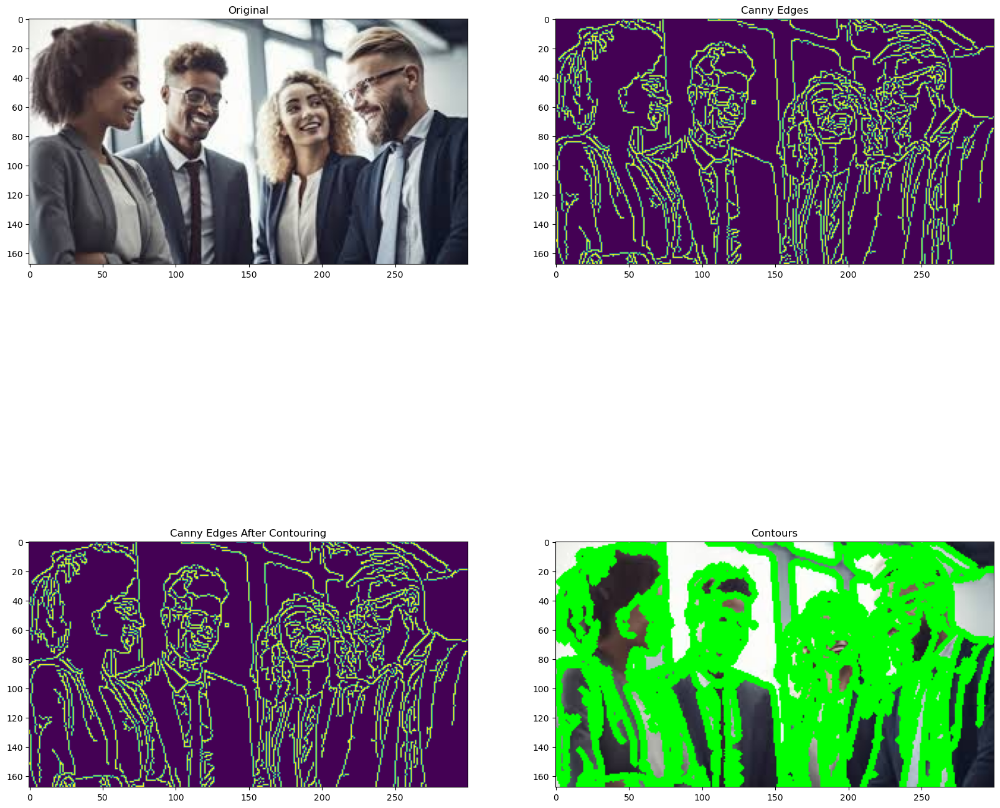

In [105]:
# Let's load a simple image with 3 black squares
image = cv2.imread(r"C:\Users\sanja\Downloads\images.jpeg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20, 20))

plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(image)


# Grayscale
gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)

# Find Canny edges
edged = cv2.Canny(gray, 30, 200)

plt.subplot(2, 2, 2)
plt.title("Canny Edges")
plt.imshow(edged)


# Finding Contours
# Use a copy of your image e.g. edged.copy(), since findContours alters the image
contours, hierarchy = cv2.findContours(edged, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

plt.subplot(2, 2, 3)
plt.title("Canny Edges After Contouring")
plt.imshow(edged)

print("Number of Contours found = " + str(len(contours)))

# Draw all contours
# Use '-1' as the 3rd parameter to draw all
cv2.drawContours(image, contours, -1, (0,255,0), 3)

plt.subplot(2, 2, 4)
plt.title("Contours")
plt.imshow(image)

<a id="11."></a> 
# 11.Approximating Contours and Convex Hull

cv2.approxPolyDP(contour, Approximation Accuracy, Closed)

* contour – is the individual contour we wish to approximate
* Approximation Accuracy – Important parameter is determining the accuracy of the approximation. Small values give precise- approximations, large values give more generic approximation. A good rule of thumb is less than 5% of the contour perimeter
* Closed – a Boolean value that states whether the approximate contour should be open or closed


In [ ]:
# Load image and keep a copy
image = cv2.imread(r"C:\Users\sanja\Downloads\images.jpeg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20, 20))

plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(image)

orig_image = image.copy()


# Grayscale and binarize
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY_INV)

# Find contours 
contours, hierarchy = cv2.findContours(thresh.copy(), cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)

# Iterate through each contour and compute the bounding rectangle
for c in contours:
    x,y,w,h = cv2.boundingRect(c)
    cv2.rectangle(orig_image,(x,y),(x+w,y+h),(0,0,255),2)    
    plt.subplot(2, 2, 2)
    plt.title("Bounding Rectangle")
    plt.imshow(orig_image)

cv2.waitKey(0) 
    
# Iterate through each contour and compute the approx contour
for c in contours:
    # Calculate accuracy as a percent of the contour perimeter
    accuracy = 0.03 * cv2.arcLength(c, True)
    approx = cv2.approxPolyDP(c, accuracy, True)
    cv2.drawContours(image, [approx], 0, (0, 255, 0), 2)
    
    plt.subplot(2, 2, 3)
    plt.title("Approx Poly DP")
    plt.imshow(image)

plt.show()
    
# Convex Hull


image = cv2.imread(r"C:\Users\sanja\Downloads\images.jpeg")
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(20, 20))

plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(image)

# Threshold the image
ret, thresh = cv2.threshold(gray, 176, 255, 0)

# Find contours 
contours, hierarchy = cv2.findContours(thresh.copy(), cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
    
# Sort Contors by area and then remove the largest frame contour
n = len(contours) - 1
contours = sorted(contours, key=cv2.contourArea, reverse=False)[:n]

# Iterate through contours and draw the convex hull
for c in contours:
    hull = cv2.convexHull(c)
    cv2.drawContours(image, [hull], 0, (0, 255, 0), 2)

    plt.subplot(1, 2, 2)
    plt.title("Convex Hull")
    plt.imshow(image)

<a id="12."></a> 
# 12.Identifiy Contours by Shape

ZeroDivisionError: float division by zero

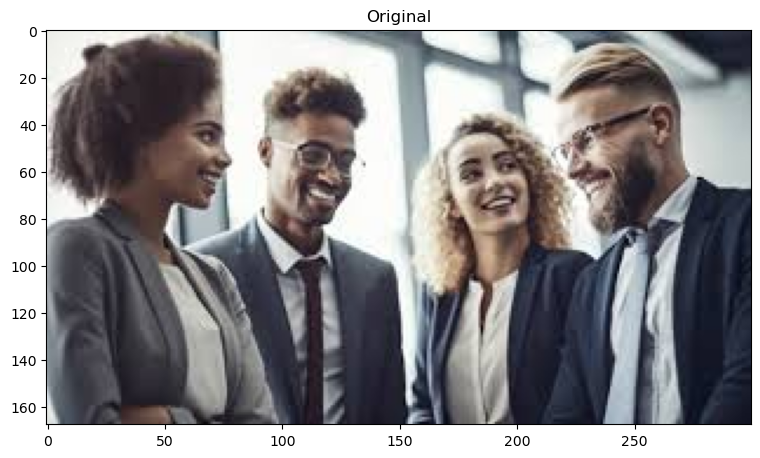

In [101]:
image = cv2.imread(r"C:\Users\sanja\Downloads\images.jpeg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(20, 20))

plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(image)

ret, thresh = cv2.threshold(gray, 127, 255, 1)

# Extract Contours
contours, hierarchy = cv2.findContours(thresh.copy(), cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)

for cnt in contours:
    
    # Get approximate polygons
    approx = cv2.approxPolyDP(cnt, 0.01*cv2.arcLength(cnt,True),True)
    
    if len(approx) == 3:
        shape_name = "Triangle"
        cv2.drawContours(image,[cnt],0,(0,255,0),-1)
        
        # Find contour center to place text at the center
        M = cv2.moments(cnt)
        cx = int(M['m10'] / M['m00'])
        cy = int(M['m01'] / M['m00'])
        cv2.putText(image, shape_name, (cx-50, cy), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 0), 2)
    
    elif len(approx) == 4:
        x,y,w,h = cv2.boundingRect(cnt)
        M = cv2.moments(cnt)
        cx = int(M['m10'] / M['m00'])
        cy = int(M['m01'] / M['m00'])
        
        # Check to see if 4-side polygon is square or rectangle
        # cv2.boundingRect returns the top left and then width and 
        if abs(w-h) <= 3:
            shape_name = "Square"
            
            # Find contour center to place text at the center
            cv2.drawContours(image, [cnt], 0, (0, 125 ,255), -1)
            cv2.putText(image, shape_name, (cx-50, cy), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 0), 2)
        else:
            shape_name = "Rectangle"
            
            # Find contour center to place text at the center
            cv2.drawContours(image, [cnt], 0, (0, 0, 255), -1)
            M = cv2.moments(cnt)
            cx = int(M['m10'] / M['m00'])
            cy = int(M['m01'] / M['m00'])
            cv2.putText(image, shape_name, (cx-50, cy), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 0), 2)
            
    elif len(approx) == 10:
        shape_name = "Star"
        cv2.drawContours(image, [cnt], 0, (255, 255, 0), -1)
        M = cv2.moments(cnt)
        cx = int(M['m10'] / M['m00'])
        cy = int(M['m01'] / M['m00'])
        cv2.putText(image, shape_name, (cx-50, cy), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 0), 2)
        
        
        
    elif len(approx) >= 15:
        shape_name = "Circle"
        cv2.drawContours(image, [cnt], 0, (0, 255, 255), -1)
        M = cv2.moments(cnt)
        cx = int(M['m10'] / M['m00'])
        cy = int(M['m01'] / M['m00'])
        cv2.putText(image, shape_name, (cx-50, cy), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 0), 2)

plt.subplot(2, 2, 2)
plt.title("Identifying Shapes")
plt.imshow(image)

<a id="13."></a> 
# 13.Line Detection - Using Hough Lines

cv2.HoughLines(binarized/thresholded image, 𝜌 accuracy, 𝜃 accuracy, threshold)

* Threshold here is the minimum vote for it to be considered a line


TypeError: 'NoneType' object is not iterable

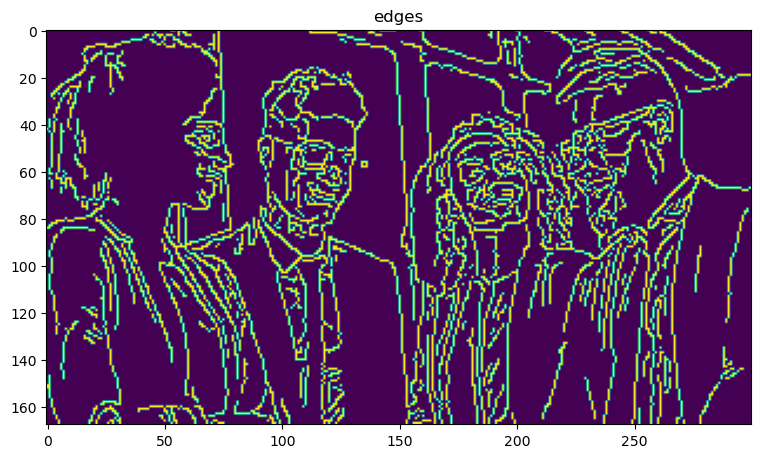

In [99]:
image = cv2.imread(r"C:\Users\sanja\Downloads\images.jpeg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20, 20))

# Grayscale and Canny Edges extracted
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
edges = cv2.Canny(gray, 100, 170, apertureSize = 3)

plt.subplot(2, 2, 1)
plt.title("edges")
plt.imshow(edges)

# Run HoughLines using a rho accuracy of 1 pixel
# theta accuracy of np.pi / 180 which is 1 degree
# Our line threshold is set to 240 (number of points on line)
lines = cv2.HoughLines(edges, 1, np.pi/180, 200)

# We iterate through each line and convert it to the format
# required by cv.lines (i.e. requiring end points)
for line in lines:
    rho, theta = line[0]
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a * rho
    y0 = b * rho
    x1 = int(x0 + 1000 * (-b))
    y1 = int(y0 + 1000 * (a))
    x2 = int(x0 - 1000 * (-b))
    y2 = int(y0 - 1000 * (a))
    cv2.line(image, (x1, y1), (x2, y2), (255, 0, 0), 2)


plt.subplot(2, 2, 2)
plt.title("Hough Lines")
plt.imshow(image)

<a id="14."></a> 
# 14.Counting Circles and Ellipses

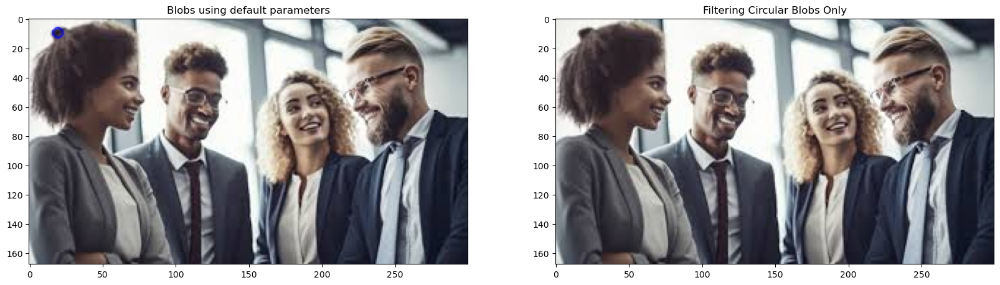

In [97]:
image = cv2.imread(r"C:\Users\sanja\Downloads\images.jpeg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20, 20))


# Intialize the detector using the default parameters
detector = cv2.SimpleBlobDetector_create()
 
# Detect blobs
keypoints = detector.detect(image)
 
# Draw blobs on our image as red circles
blank = np.zeros((1,1)) 
blobs = cv2.drawKeypoints(image, keypoints, blank, (0,0,255),
                                      cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

number_of_blobs = len(keypoints)
text = "Total Number of Blobs: " + str(len(keypoints))
cv2.putText(blobs, text, (20, 550), cv2.FONT_HERSHEY_SIMPLEX, 1, (100, 0, 255), 2)

# Display image with blob keypoints
plt.subplot(2, 2, 1)
plt.title("Blobs using default parameters")
plt.imshow(blobs)


# Set our filtering parameters
# Initialize parameter settiing using cv2.SimpleBlobDetector
params = cv2.SimpleBlobDetector_Params()

# Set Area filtering parameters
params.filterByArea = True
params.minArea = 100

# Set Circularity filtering parameters
params.filterByCircularity = True 
params.minCircularity = 0.9

# Set Convexity filtering parameters
params.filterByConvexity = False
params.minConvexity = 0.2
    
# Set inertia filtering parameters
params.filterByInertia = True
params.minInertiaRatio = 0.01

# Create a detector with the parameters
detector = cv2.SimpleBlobDetector_create(params)
    
# Detect blobs
keypoints = detector.detect(image)

# Draw blobs on our image as red circles
blank = np.zeros((1,1)) 
blobs = cv2.drawKeypoints(image, keypoints, blank, (0,255,0),
                                      cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

number_of_blobs = len(keypoints)
text = "Number of Circular Blobs: " + str(len(keypoints))
cv2.putText(blobs, text, (20, 550), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 100, 255), 2)

# Show blobs
plt.subplot(2, 2, 2)
plt.title("Filtering Circular Blobs Only")
plt.imshow(blobs)

<a id="15."></a> 
# 15.Finding Corners

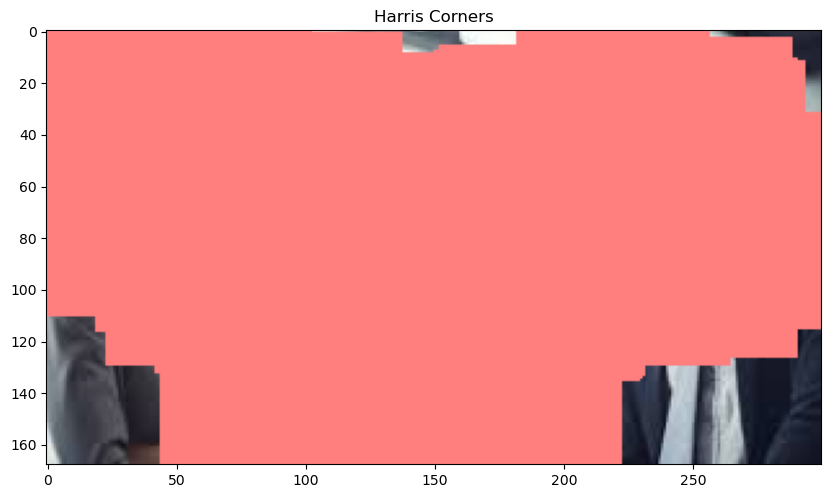

In [95]:
# Load image then grayscale
image = cv2.imread(r"C:\Users\sanja\Downloads\images.jpeg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 10))

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# The cornerHarris function requires the array datatype to be float32
gray = np.float32(gray)

harris_corners = cv2.cornerHarris(gray, 3, 3, 0.05)

#We use dilation of the corner points to enlarge them\
kernel = np.ones((7,7),np.uint8)
harris_corners = cv2.dilate(harris_corners, kernel, iterations = 10)

# Threshold for an optimal value, it may vary depending on the image.
image[harris_corners > 0.025 * harris_corners.max() ] = [255, 127, 127]

plt.subplot(1, 1, 1)
plt.title("Harris Corners")
plt.imshow(image)

<a id="16."></a> 
# 16.Finding Waldo

In [93]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import zipfile
import os

# Step 1: Unzip the .zip file containing the image
zip_path = r"C:\Users\sanja\Downloads\Background-Subtraction-Tutorial_merged.gif.zip"
extract_to = r"C:\Users\sanja\Downloads\extracted_image"

# Extract the zip file
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

# List the files in the extracted folder to verify the contents
extracted_files = os.listdir(extract_to)
print("Extracted files:", extracted_files)

# Locate the extracted image file (replace with the correct name of the image file inside the .zip)
extracted_image_path = os.path.join(extract_to, 'Background-Subtraction-Tutorial_merged.gif')  # Replace with actual file name
print("Extracted image path:", extracted_image_path)

# Step 2: Read the input image
image = cv2.imread(extracted_image_path)

# Check if the image is loaded correctly
if image is None:
    raise ValueError(f"Failed to load the image from {extracted_image_path}. Please check the file path.")

image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB

# Step 3: Display the input image
plt.figure(figsize=(30, 30))

plt.subplot(2, 2, 1)
plt.title("Where is Waldo?")
plt.imshow(image)

# Convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Step 4: Load the template image
template_path = r"C:\path\to\your\template\waldo.jpg"  # Adjust this path
template = cv2.imread(template_path, 0)  # Load the template as grayscale

# Check if the template is loaded correctly
if template is None:
    raise ValueError(f"Failed to load the template from {template_path}. Please check the file path.")

# Step 5: Template Matching
result = cv2.matchTemplate(gray, template, cv2.TM_CCOEFF)
min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)

# Create a bounding box around the match
top_left = max_loc
height, width = template.shape
bottom_right = (top_left[0] + width, top_left[1] + height)

# Draw rectangle on the image
cv2.rectangle(image, top_left, bottom_right, (0, 0, 255), 5)

# Display the result with bounding box
plt.subplot(2, 2, 2)
plt.title("Waldo Found!")
plt.imshow(image)

plt.show()


Extracted files: ['Background-Subtraction-Tutorial_merged.gif']
Extracted image path: C:\Users\sanja\Downloads\extracted_image\Background-Subtraction-Tutorial_merged.gif


ValueError: Failed to load the image from C:\Users\sanja\Downloads\extracted_image\Background-Subtraction-Tutorial_merged.gif. Please check the file path.

<a id="17."></a> 
# 17.Background Subtraction Methods

error: OpenCV(4.10.0) D:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\color.cpp:196: error: (-215:Assertion failed) !_src.empty() in function 'cv::cvtColor'


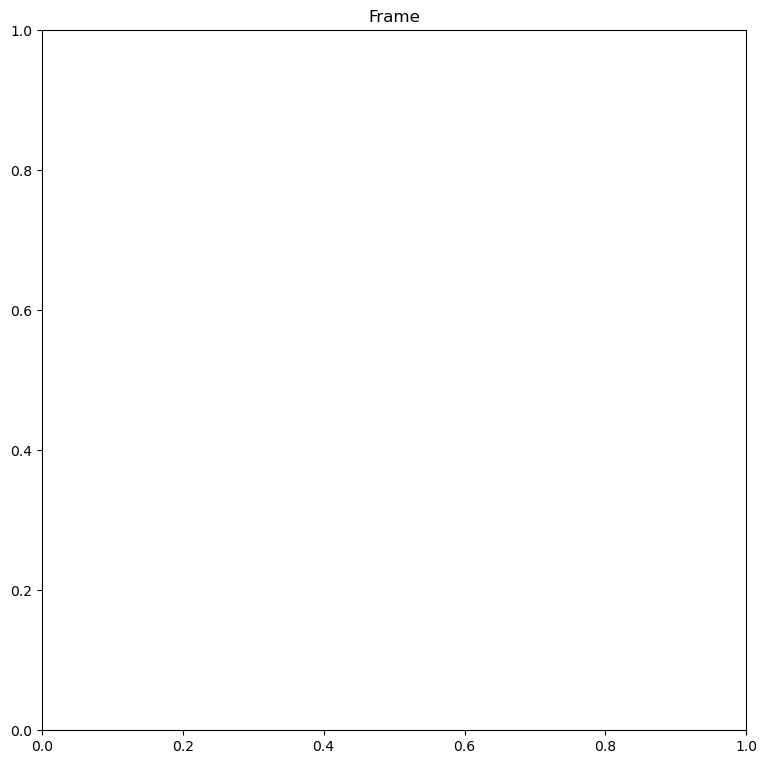

In [62]:
import cv2 
import matplotlib.pyplot as plt

algo = 'MOG2'

if algo == 'MOG2':
    backSub = cv2.createBackgroundSubtractorMOG2()
else:
    backSub = cv2.createBackgroundSubtractorKNN()

plt.figure(figsize=(20, 20))

frame = cv2.imread
fgMask = backSub.apply(frame)

plt.subplot(2, 2, 1)
plt.title("Frame")
plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))

plt.subplot(2, 2, 2)
plt.title("FG Mask")
plt.imshow(cv2.cvtColor(fgMask, cv2.COLOR_BGR2RGB))
                       
frame = cv2.imread
fgMask = backSub.apply(frame)

plt.subplot(2, 2, 3)
plt.title("Frame")
plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))

plt.subplot(2, 2, 4)
plt.title("FG Mask")
plt.imshow(cv2.cvtColor(fgMask, cv2.COLOR_BGR2RGB))

## If you want to run it on video and locally, you must set it to (While) True. (Do not try on Kaggle you will get the error)



## The result you will get on video and locally

![](https://iili.io/JMXhdv.gif)

So now as we know that by defining Z as a function of X and Y we can create different types of distortion effects. Let us create some more effects using the above code. We simply need to change the line where we define Z as a function of X and Y. This will further help you to create your own effects.

Let’s create something using sine function !